# Проект 8 - Кафе в Москве

## Введение

**Описание проекта**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Описание данных**

Таблица `moscow_places`.

1. `name` — название заведения.
2. `address` — адрес заведения.
3. `category` — категория заведения, например «кафе», «пиццерия» или «кофейня».
4. `hours` — информация о днях и часах работы.
5. `lat` — широта географической точки, в которой находится заведение.
6. `lng` — долгота географической точки, в которой находится заведение.
7. `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах.
8. `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее.
9. `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона
10. `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт».
11. `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Цена одной чашки капучино».
12. `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым.
13. `district` — административный район, в котором находится заведение.
14. `seats` — количество посадочных мест.

In [28]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import folium as flm
import json
from IPython.display import display
from folium.plugins import MarkerCluster
plt.style.use('default')

# Save raw datasets in case we need them
try:
    raw_places = pd.read_csv('moscow_places.csv')
    gj_moscow = json.load(
        open('admin_level_geomap.geojson', 'r', encoding='utf-8')
    )
except:
    raw_places = pd.read_csv('/datasets/moscow_places.csv')
    gj_moscow = json.load(
        open('/datasets/admin_level_geomap.geojson', 'r')
    )
    
# Constants, which we will need later
FIG_WIDTH = 10
FIG_HEIGHT = 5


## Предобработка данных

Для начала проверим какие данные нам достались. Нас интересуют:

1. Названия колонок.
2. Неподходящие под тип данных значения в колонках.
3. Артефакты в данных и повторяющиеся строки.
4. Пропущенные значения.
5. Дополнительные колонки и типы данных.

Пойдем по порядку.

In [29]:
# Dataset sample
display(raw_places.head(3))


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0


In [30]:
# Columns and datatypes
raw_places.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [31]:
# Function to get columns with nans
def fun_get_columns_with_nan(df: pd.DataFrame) -> list:
    """
    This function returns a list of column names, which have null or NaN values.

    Args:
        df (DataFrame): A dataframe to check.

    Returns:
        columns_with_nan (list): A list of column names which have nulls or NaNs inside.
    """
    columns_with_null = []

    for column in df.columns:
        if df[column].isna().sum() > 0:
            columns_with_null.append(column)
    return columns_with_null

# Let's check these columns
print('Columns with NaNs:')
print(fun_get_columns_with_nan(raw_places))
print('Number of cells with NaNs in each column:')
print(raw_places[ fun_get_columns_with_nan(raw_places) ].isna().sum())


Columns with NaNs:
['hours', 'price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup', 'seats']
Number of cells with NaNs in each column:
hours                 536
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
seats                3611
dtype: int64


Очень красивая таблица. Из хорошего: у нас есть данные почти по 8.5К заведений, нам не надо менять названия колонок. Из плохого: у нас есть много пропусков (например, в `seats` - эту колонку мы будем использовать позже), некоторые из типов данных можно поменять (флаг `chain`, например, может быть `boolean`).

Посмотрим теперь на дубликаты. Нас интересуют полные дубликаты, а также частичные. Например, вряд ли у нас есть заведение с одним и тем же названием на одной и той же улице.

In [32]:
# Find duplicates
print('Total number of rows in a raw dataset:', raw_places.name.count())
print('Total number of rows in a cleaned dataset:', raw_places.drop_duplicates().name.count())
print('Number of full duplicates:',
      round(
          100 - 100 * raw_places.drop_duplicates().name.count()
          / raw_places.name.count(), 2)
      , '%' )
print('Number of name-address pair duplicates:',
      round(
          100 - 100 * raw_places.drop_duplicates(subset=['name', 'address']).name.count()
          / raw_places.name.count(), 2),
      '%' )


Total number of rows in a raw dataset: 8406
Total number of rows in a cleaned dataset: 8406
Number of full duplicates: 0.0 %
Number of name-address pair duplicates: 0.0 %


Дубликатов нет. Это хорошо. Проверим странные значения в числовых колонках: есть ли у нас выбивающиеся из общего набора места?



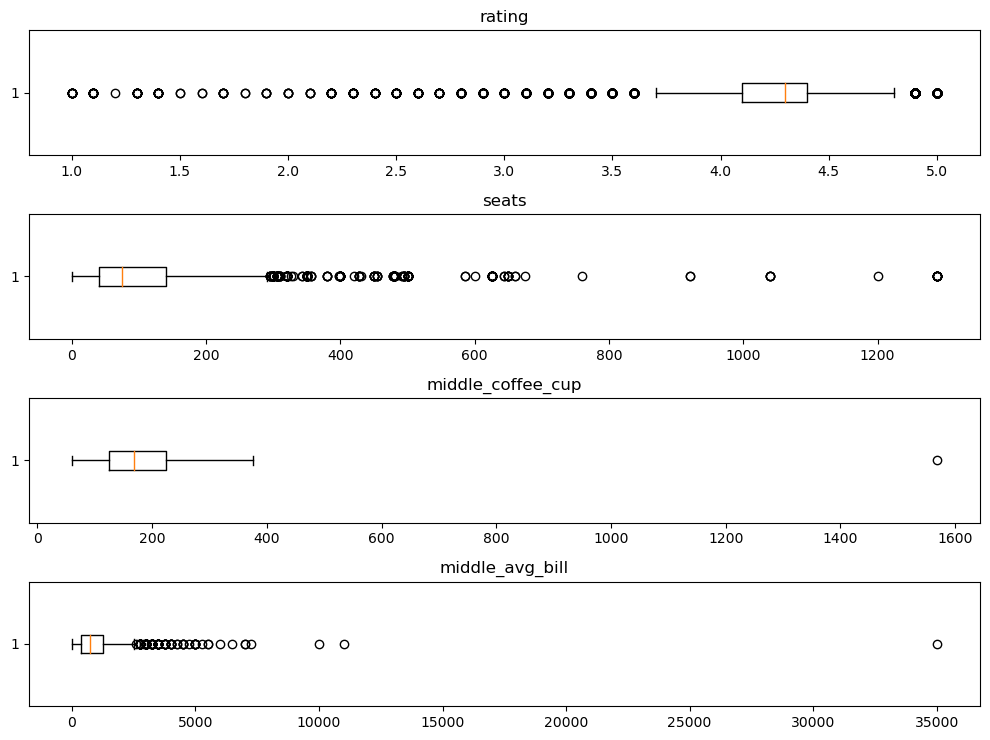

In [33]:
# Boxplotting
def fun_get_boxplots_for_columns(
    df: pd.DataFrame, columns: list, num_rows: int, num_columns: int, orientation=True
    ):
    """
    This function creates a num_rows x num_columns box subplots for a list of columns out of the dataset.

    Args:
        df (DataFrame): dataframe with data to show.
        columns (list): list of columns to plot.
        num_rows (int): number of rows in subplots.
        num_columns (int): number of columns in subplots.
        orientation (bool): orientation of the plots (False for horizontal and True for vertical)
    """
    
    fig, axs = plt.subplots(
        num_rows, num_columns, figsize=(FIG_WIDTH, 1.5*FIG_HEIGHT)
    )
    for i, ax in enumerate(axs.flat):
        ax.boxplot(df[columns[i]].dropna(), vert=orientation)
        ax.set_title(df[columns].columns[i])

    plt.tight_layout()
    
fun_get_boxplots_for_columns(
    raw_places, ['rating', 'seats', 'middle_coffee_cup', 'middle_avg_bill'],
    4, 1, orientation=False
)


In [34]:
# Statistics
display(round(raw_places[['rating', 'middle_avg_bill', 'middle_coffee_cup', 'seats']].describe(), 1).T)


,count,mean,std,min,25%,50%,75%,max
rating,8406.0,4.2,0.5,1.0,4.1,4.3,4.4,5.0
middle_avg_bill,3149.0,958.1,1009.7,0.0,375.0,750.0,1250.0,35000.0
middle_coffee_cup,535.0,174.7,89.0,60.0,124.5,169.0,225.0,1568.0
seats,4795.0,108.4,122.8,0.0,40.0,75.0,140.0,1288.0


Похоже, у нас есть парочка странных записей. В колонке `middle_avg_bill` значения в 35К рублей нас вряд ли интересуют. То же самое можно сказать про `middle_coffee_cup` за 1600 рублей. Это, скорей всего, не ошибки, а просто дорогие заведения. В последней колонке `seats` у нас явно есть какие-то концертные залы в 500 посадочных мест. Думаю, все эти значения можно обрезать.

Причешем наш датасет: немного переименуем пару колонок для удобства, добавим парочку новых. Первая колонка `name_street` будет содержать название улицы из колонки `address`. Это относительно легко сделать: название улицы всегда находится между двумя запятыми. Вторая колонка `is_24_7` покажет, если заведение работает ежедневно и круглосуточно.

Пропущенные значения оставим на месте: их слишком много, чтобы просто удалить эти строки. Текстовые значения мы все равно не сможем заменить на какие-то осмысленные (при условии, что мы не хотим искать эту информацию в сторонних источниках), а замена в числовых значениях может ввести в заблуждение.

Наконец, в числовых колонках у нас есть `nan` и поэтому они определились как `float`. Очевидно, что у нас не может быть дробных посадочных мест (а копейки в чеке нас не интересуют), но мы это заигнорим. По необъяснимой причине, `pandas` еще не научился справляться с целочисленными колонками с пропусками, а существующие костыли в виде `Int64` не работают с методами вроде `mean`. Штош.

In [35]:
# Let's clean
df_places = (
    raw_places[
        (raw_places.middle_avg_bill.fillna(0) < 10e3)
        & (raw_places.middle_coffee_cup.fillna(0) < 1e3)
        & (raw_places.seats.fillna(0) < 400)
    ]
    .copy()
    .rename(
        columns={
            'name': 'name_place',
            'chain': 'is_chain'
        }
    )
    .assign(
        name_street = lambda df: df.address.str.split(',', expand=True)[1],
        is_24_7 = lambda df: np.where(
            df.hours.str.contains(
                r'^(?=.*ежедневно)(?=.*круглосуточно)',
                case=False, regex=True, na=False),
            True, False
        ),
        is_chain = lambda df: df.is_chain.replace({0: False, 1: True}),
    )
)


Посмотрим, что получилось.

Total number of rows in a raw dataset: 8406
Total number of rows in a cleaned dataset: 8270
Number of rows dropped: 1.62 %


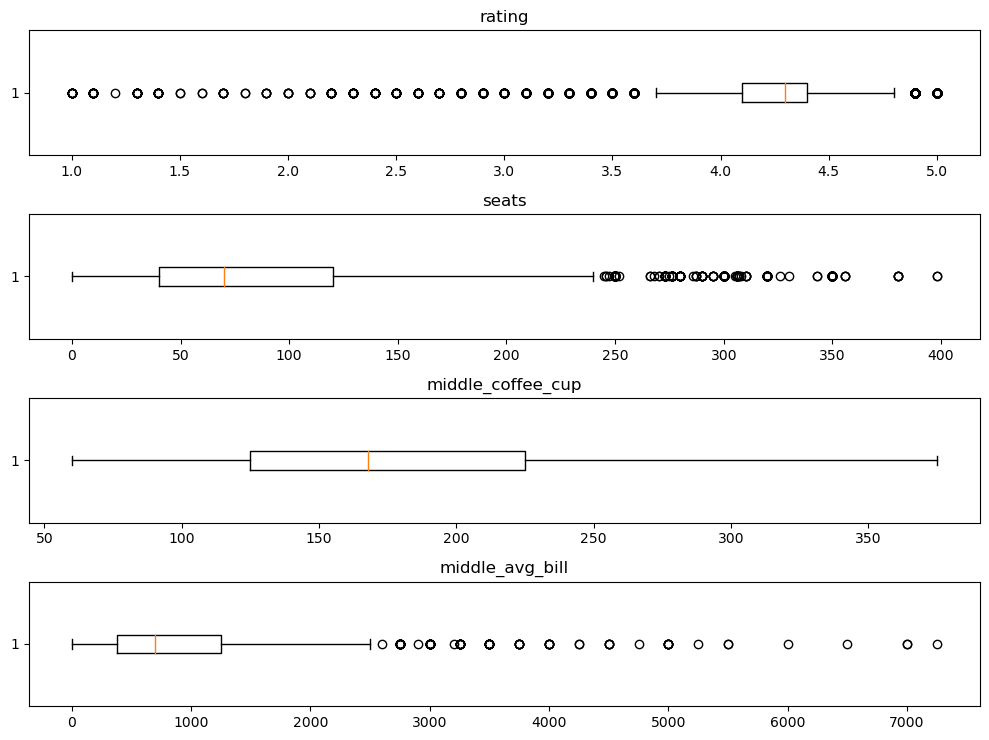

In [36]:
# Find duplicates
print('Total number of rows in a raw dataset:', raw_places.name.count())
print('Total number of rows in a cleaned dataset:', df_places.name_place.count())
print('Number of rows dropped:',
      round(
          100 - 100 * df_places.name_place.count()
          / raw_places.name.count(), 2)
      , '%' )

fun_get_boxplots_for_columns(
    df_places, ['rating', 'seats', 'middle_coffee_cup', 'middle_avg_bill'],
    4, 1, orientation=False
)


## Исследовательский анализ

Посмотрим, какие зависимости на рынке мы сможем найти: сколько есть заведений каждого типа, как у них с посадочными местами, где они расположены.

### Количество локаций, посадочных мест, типы и рейтинги заведений

Начнем с количества локаций по категориям.

In [37]:
# Number of cafes per category
df_temp = (
    pd.pivot_table(
        data=df_places,
        index=['category', 'is_chain'],
        values='name_place',
        aggfunc='count',
    )
    .reset_index()
    .set_axis(
        ['category', 'is_chain', 'place_count'],
        axis=1
    )
    .rename_axis('index', axis=1)
    .sort_values(by='place_count')
)

fig = px.bar(
    df_temp,
    x='place_count',
    y='category',
    color='is_chain',
    text_auto=True,
    title='Total number of locations by category by chain category',
    labels=dict(
        place_count='Number of locations',
        category='Location category',
        is_chain='Chain status'
    ),
    width=FIG_WIDTH*100,
    height=FIG_HEIGHT*100,
    template='plotly_white'
)
fig.update_layout(
    legend=dict(
        orientation="h",
        yanchor='top', y=1.1, x=0
    ),
    yaxis={'categoryorder':'total ascending'}
)
fig.show()

display(
    pd.pivot_table(
        data=df_temp,
        index='category',
        values='place_count',
        aggfunc='sum',
        margins=True
    )
    .reset_index()
    .set_axis(
        ['category', 'place_count'],
        axis=1
    )
    .rename_axis('index', axis=1)
    .assign(
        place_per = lambda df: round(100 * df.place_count / df.place_count.iloc[-1], 1),
        sort_key = lambda df: df.category == 'All'
    )
    .sort_values(['sort_key', 'place_per'], ascending=[True, False])
    .drop('sort_key', axis=1)
)


index,category,place_count,place_per
3,кафе,2345,28.4
6,ресторан,2000,24.2
4,кофейня,1392,16.8
0,"бар,паб",743,9.0
5,пиццерия,625,7.6
2,быстрое питание,599,7.2
7,столовая,312,3.8
1,булочная,254,3.1
8,All,8270,100.0


Москва - это город кафе и ресторонав. Их более 4К из общего количества в 8.3К. Это ожидаемо: сходить на чашечку кофе - любимое занятие молодежи (предположительно). Следом идут кофейни и пабы, которых чуть более 2К. И затем уже остальные заведения.

Посмотрим на распределения посадочных мест.

In [38]:
# Number of seats
df_temp = (
    pd.pivot_table(
        data=df_places[df_places.seats > 0],
        index='category',
        values='seats',
        aggfunc=['mean', 'median'],
    )
    .reset_index()
    .set_axis(
        ['category', 'seats_mean', 'seats_median'],
        axis=1
    )
    .rename_axis('index', axis=1)
    .sort_values(by='seats_mean', ascending=False)
)

fig = px.violin(
    df_places,
    y='seats',
    x='category',
    # spanmode='hard',
    title='Distribution of # of seats by category',
    labels=dict(
        seats='Distribution of # of seats',
        category='Location type',
    ),
    width=FIG_WIDTH*100,
    height=FIG_HEIGHT*100,
    template='plotly_white'
)
fig.show()

display(round(df_temp, 1))


index,category,seats_mean,seats_median
6,ресторан,108.2,85.0
0,"бар,паб",101.8,80.0
4,кофейня,99.7,80.0
2,быстрое питание,98.1,70.0
7,столовая,90.4,76.0
1,булочная,89.8,50.0
5,пиццерия,86.8,55.0
3,кафе,86.7,60.0


Количество мест отличается по типу заведения, но несильно. В средем, в ресторанах, пабах и кофейнях у нас около 100 посадочных мест с медианой в районе 82. Стоит отметить, что для булочных, пиццерий и кафе средние значения сильно отличаются от медианных, что намекает на большой разброс возможных вариантов.

Дальше исследуем распределение сетевых и несетевых заведений.

In [39]:
# Chain vs non-chain places per category
df_temp = (
    pd.pivot_table(
        data=df_places,
        index='category',
        columns='is_chain',
        values='name_place',
        aggfunc='count',
        margins=True,
    )
    .reset_index()
    .set_axis(
        ['category', 'places_not_a_chain_count', 'places_is_a_chain_count', 'places_total'],
        axis=1
    )
    .assign(
        places_not_a_chain_per = lambda df: round(100 * df.places_not_a_chain_count / df.places_total, 1),
        places_is_a_chain_per = lambda df: round(100 * df.places_is_a_chain_count / df.places_total, 1),
        sort_key = lambda df: df.category == 'All',
    )
    .sort_values(['sort_key', 'places_not_a_chain_per'], ascending=[True, False])
    .drop('sort_key', axis=1)
)

fig = px.bar(
    df_temp,
    x=['places_not_a_chain_per', 'places_is_a_chain_per'],
    y='category',
    text_auto=True,
    title='Split of locations # by category by chain status',
    labels=dict(
        value='Percentage of sites of that status',
        category='Location category',
        variable='Chain status'
    ),
    width=FIG_WIDTH*100,
    height=FIG_HEIGHT*100,
    template='plotly_white'
)
fig.update_xaxes(showticklabels=False)
fig.update_layout(
    legend=dict(
        orientation="h",
        yanchor='top', y=1.1, x=0
    ),
    yaxis={'categoryorder':'total ascending'}
)
fig.show()

display(
    df_temp[[
        'category',
        'places_total', 'places_not_a_chain_count', 'places_is_a_chain_count',
        'places_not_a_chain_per', 'places_is_a_chain_per'
    ]]
    .rename_axis('index', axis=1)
    .assign(
        sort_key = df_temp.category == 'All'
    )
    .sort_values(['sort_key', 'places_total'], ascending=[True, False])
    .drop('sort_key', axis=1)
)


index,category,places_total,places_not_a_chain_count,places_is_a_chain_count,places_not_a_chain_per,places_is_a_chain_per
3,кафе,2345,1579,766,67.3,32.7
6,ресторан,2000,1287,713,64.4,35.6
4,кофейня,1392,685,707,49.2,50.8
0,"бар,паб",743,577,166,77.7,22.3
5,пиццерия,625,300,325,48.0,52.0
2,быстрое питание,599,368,231,61.4,38.6
7,столовая,312,226,86,72.4,27.6
1,булочная,254,99,155,39.0,61.0
8,All,8270,5121,3149,61.9,38.1


У нас получилось интересное распределение. Большинство заведений в нашем датасете - несетевые. Таких у нас 5.1К (~62%). Однако распределение по категориям неоднородное: булочные, в основном, являются сетевыми (~61%), а бар и пабы наоборот - несетевые (~77.7%).

Проверим, какие самые популярные заведения.

In [40]:
# Number of locations by name
df_temp = (
    pd.pivot_table(
        data=df_places,
        index=['name_place', 'category'],
        values='is_chain',
        aggfunc='count'
    )
    .reset_index()
    .set_axis(
        ['name_place', 'category', 'place_count'],
        axis=1
    )
    .sort_values(by='place_count', ascending=False)
)

fig = px.bar(
    df_temp.head(15),
    x='place_count',
    y='name_place',
    color='category',
    text_auto=True,
    title='Most popular locations by category',
    labels=dict(
        name_place='Place name',
        place_count='# of locations',
        category='Location category',
    ),
    width=FIG_WIDTH*100,
    height=FIG_HEIGHT*100,
    template='plotly_white'
)
fig.update_xaxes(showticklabels=False)
fig.update_layout(
    legend=dict(
        orientation="h",
        yanchor='top', y=1.1, x=0
    ),
    yaxis={'categoryorder':'total ascending'}
)
fig.show()


Ожидаемо, у нас много кафе "Кафе", в которых, вероятно, подают коньяк "Коньяк". Помимо них, видим также много популярных сетей: Шоколадница, Доминос и Додо пицца, Теремок. В основном, это относительно мелкие заведния полу-фастфуда.

Наконец, посмотрим, какие средние рейтинги у заведений разного типа.

In [41]:
# Average rating per location category
df_temp = (
    pd.pivot_table(
        data=df_places,
        index='category',
        values='rating',
        aggfunc='mean'
    )
    .reset_index()
    .set_axis(
        ['category', 'rating_mean'],
        axis=1
    )
    .sort_values(by='rating_mean', ascending=False)
)

fig = px.bar(
    round(df_temp, 2),
    x='rating_mean',
    y='category',
    text_auto=True,
    title='Highest average rating across each category',
    labels=dict(
        rating_mean='Average rating',
        category='Location category',
    ),
    width=FIG_WIDTH*100,
    height=FIG_HEIGHT*100,
    template='plotly_white'
)
fig.update_xaxes(range=[3, 5])
fig.update_layout(
    legend=dict(
        orientation="h",
        yanchor='top', y=1.1, x=0
    ),
    yaxis={'categoryorder':'total ascending'}
)
fig.show()


Бары и пабы выигрывают в средних рейтингах заведений, а вот кафе и быстрое питание отстают. Есть предположение, что бары, рестораны, кофейни цепляют атмосферой больше, чем едой. А вот столовым и кафе приходится соревноваться качеством продукции.

### Расположение заведений

Вторым упражнением посмотрим на расположение этих заведений по улицам и районам; проверим, как это влияет на средний чек.

In [42]:
# Number of locations per category, per district
df_temp = (
    pd.pivot_table(
        data=df_places,
        index='district',
        columns='category',
        values='is_chain',
        aggfunc='count',
        margins=True,
    )
    .sort_values(by='All', axis=1, ascending=False)
    .reset_index()
    .rename_axis('index', axis=1)
    .assign(
        sort_key = lambda df: df.district == 'All',
    )
    .sort_values(['sort_key', 'All'], ascending=[True, False])
    .drop('sort_key', axis=1)
)

fig = px.imshow(
    df_temp.iloc[0: -1, 2: :],
    y=df_temp.iloc[0: -1, :].district,
    x=df_temp.iloc[0: -1, 2: :].columns,
    text_auto=True,
    aspect='auto',
    title='Distribution of locations by district by category',
    labels=dict(x='Location category'),
    width=FIG_WIDTH*100,
    height=FIG_HEIGHT*100,
    template='plotly_white'
)
fig.show()


Центральный административный округ опрежает остальные округа по всем категориям заведений. Это опять ожидаемо (у нас много ожидаемых результатов): самый большой трафик всегда будет в центре столицы. Разумно ловить своих потенциальных клиентов там, где их больше всего.

In [43]:
# Number of locations per category, per district
df_temp = (
    pd.pivot_table(
        data=df_places,
        index='name_street',
        columns='category',
        values='is_chain',
        aggfunc='count',
        margins=True,
    )
    .sort_values(by='All', axis=1, ascending=False)
    .reset_index()
    .rename_axis('index', axis=1)
    .assign(
        sort_key = lambda df: df.name_street == 'All',
    )
    .sort_values(['sort_key', 'All'], ascending=[True, False])
    .drop('sort_key', axis=1)
)

fig = px.imshow(
    df_temp.iloc[0: -1, 2: :].head(15),
    y=df_temp.iloc[0: -1, :].head(15).name_street,
    x=df_temp.iloc[0: -1, 2: :].columns,
    text_auto=True,
    aspect='auto',
    title='Distribution of locations by street by category',
    labels=dict(x='Location category'),
    width=FIG_WIDTH*100,
    height=FIG_HEIGHT*100,
    template='plotly_white'
)
fig.show()


С улицами чуть менее очевидная история. Явно лидируют длинные магистрали: на них больше всего заведений, особенно кафе. Следует выделить МКАД - хоть суммарно на ней мало мест для перекуса, тем не менее эта дорога вторая по количеству кафе (вероятно, чтобы автомобилистам было где перекусить).

In [44]:
# Streets with just one location
print('Number of streets with a single location: ', df_temp[df_temp.All == 1].name_street.count())
print(
    'and as percentage from total: ', 
    round(100 * df_temp[df_temp.All == 1].name_street.count() / df_temp.name_street.count(), 2), '%'
)


Number of streets with a single location:  459
and as percentage from total:  31.68 %


In [45]:
# Single streets by district
df_temp = (
    pd.pivot_table(
        data=df_places,
        index=['district', 'name_street'],
        values='is_chain',
        aggfunc='count',
    )
    .reset_index()
    .rename_axis('index', axis=1)
    .set_axis(
        ['district', 'name_street', 'place_count'],
        axis=1
    )
)

fig = px.bar(
    pd.pivot_table(
        data=df_temp[df_temp.place_count == 1],
        index='district',
        values='place_count',
        aggfunc='sum'
    ).reset_index(),
    x='place_count',
    y='district',
    text_auto=True,
    title='Number of streets with only one location per district',
    labels=dict(
        place_count='# of streets',
        district='District',
    ),
    width=FIG_WIDTH*100,
    height=FIG_HEIGHT*100,
    template='plotly_white'
)
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.update_xaxes(showticklabels=False)
fig.show()


ЦАО снова является лидером, но на этот раз по количеству улиц с одним заведением. Самая вероятная причина - это протяженность улиц. Они короткие, поэтому только одно заведение. С другой стороны, в центре может быть также высокая стоимость аренды и много приключений для получения различных разрешений.

In [46]:
# How ratings look on a map
m = flm.Map(
    location=[55.751244, 37.618423], zoom_start=10
)
flm.Choropleth(
    data=(
        pd.pivot_table(
            data=df_places,
            index='district',
            values='rating',
            aggfunc='mean'
        ).reset_index()
    ),
    geo_data=gj_moscow,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Average rating by district',
).add_to(m)

m


Капитан очевидность снова в деле: в центре как и уровень сервиса может быть повыше, так и в целом больше ультра дорогих заведений для соответствующей аудитории. Это может объяснить, почему средние рейтинги довольно ощутимо выше по сравнению с остальными округами.

Отдельно отметим северо-запад - он старается. И юго-восток - он не старается.

In [47]:
# All locations
marker_cluster = MarkerCluster().add_to(m)

def fun_create_clusters(row):
    """
    пишем функцию, которая принимает строку датафрейма,
    создаём маркер в текущей точке и добавляем его в кластер marker_cluster

    Args:
        row: _description_
    """
    flm.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name_place']} {row['rating']}",
    ).add_to(marker_cluster)

df_places.apply(fun_create_clusters, axis=1)
m


И действительно, очень много заведений в центре Москвы.

In [48]:
# How median bill look on a map
m = flm.Map(
    location=[55.751244, 37.618423], zoom_start=10
)
flm.Choropleth(
    data=(
        pd.pivot_table(
            data=df_places,
            index='district',
            values='middle_avg_bill',
            aggfunc='median'
        ).reset_index()
    ),
    geo_data=gj_moscow,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Median bill by district',
).add_to(m)

m


В вот это уже поинтереснее: в центре средний чек самый высокий, но он также высокий и на западе Москвы. Виновата Рублевка? Возможно, дело в маленькой выборке - у нас много пропущенных записей в колонке `middle_avg_bill`.

### Выводы по исследовательскому анализу

1. Большинство заведений в выборке - это кафе (28%), рестораны (24%) и кофейни (17%). Каждая остальная категория заведний занимает не более 10%. Большинство заведений (62%) являются сетевыми.

2. Медиана по количеству мест по категориям колеблется от 60 до 85. Средние разбросаны чуть больше от 87 до 109 мест.

3. Наиболее часто встречаются мелкие сетевые заведения, особенно - кафе "Кафе".

4. В ЦАО находится большинство заведений общественного питания, а также большиство улиц с только одним заведением. Далее примерно в равных долях идут САО, ЮАО, СВАО и ЗАО. Похожим образом распеределны рейтинги заведений.

5. Медиана цен в ЦАО выше, чем в дргуих округах Москвы, но стоит отметить ЗАО - он несильно отстает.

## Перспективы открытия кофейни

Последним шагом посмотрим, имеет ли смысл открывать новую кофейню в Москве, а если да, то где и на каких условиях.

In [49]:
# Select cafes only
df_places = df_places[df_places.category == 'кафе']

# Number of cafes per district
df_temp = (
    pd.pivot_table(
        data=df_places,
        index=['district', 'is_chain'],
        values='name_place',
        aggfunc='count',
    )
    .reset_index()
    .set_axis(
        ['district', 'is_chain', 'place_count'],
        axis=1
    )
    .rename_axis('index', axis=1)
    .sort_values(by='place_count')
)

fig = px.bar(
    df_temp,
    x='place_count',
    y='district',
    color='is_chain',
    text_auto=True,
    title='Total number of cafes by district by chain category',
    labels=dict(
        place_count='Number of cafes',
        district='Location district',
        is_chain='Chain status'
    ),
    width=FIG_WIDTH*100,
    height=FIG_HEIGHT*100,
    template='plotly_white'
)
fig.update_layout(
    legend=dict(
        orientation="h",
        yanchor='top', y=1.1, x=0
    ),
    yaxis={'categoryorder':'total ascending'}
)
fig.show()

display(
    pd.pivot_table(
        data=df_temp,
        index='district',
        values='place_count',
        aggfunc='sum',
        margins=True
    )
    .reset_index()
    .set_axis(
        ['district', 'place_count'],
        axis=1
    )
    .rename_axis('index', axis=1)
    .assign(
        place_per = lambda df: round(100 * df.place_count / df.place_count.iloc[-1], 1),
        sort_key = lambda df: df.district == 'All'
    )
    .sort_values(['sort_key', 'place_per'], ascending=[True, False])
    .drop('sort_key', axis=1)
)


index,district,place_count,place_per
5,Центральный административный округ,452,19.3
6,Юго-Восточный административный округ,282,12.0
0,Восточный административный округ,269,11.5
3,Северо-Восточный административный округ,266,11.3
8,Южный административный округ,262,11.2
7,Юго-Западный административный округ,236,10.1
1,Западный административный округ,232,9.9
2,Северный административный округ,231,9.9
4,Северо-Западный административный округ,115,4.9
9,All,2345,100.0


Кафе распределены чуть более равномерно по округам, чем все заведения, хотя есть явный лидер - ЦАО.

Проверим, где кафе расположены на карте и какие у них рейтинги.

In [50]:
# How ratings look on a map
m = flm.Map(
    location=[55.751244, 37.618423], zoom_start=10
)
flm.Choropleth(
    data=(
        pd.pivot_table(
            data=df_places,
            index='district',
            values='rating',
            aggfunc='mean'
        ).reset_index()
    ),
    geo_data=gj_moscow,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Average rating by district',
).add_to(m)

# add locations
marker_cluster = MarkerCluster().add_to(m)
df_places.apply(fun_create_clusters, axis=1)

m


Опять видим очень похожую картину, как и для всей выборки. Локации в центре имеют высокие рейтинги (и их больше), хотя на севере Москвы тоже есть на что посмотреть (вероятно, благодаря Ленинградскому шоссе).

Следующим шагом посмотрим на стоимость чашки капучино по районам.

In [51]:
# How median coffee cup looks on a map
m = flm.Map(
    location=[55.751244, 37.618423], zoom_start=10
)
flm.Choropleth(
    data=(
        pd.pivot_table(
            data=df_places,
            index='district',
            values='middle_coffee_cup',
            aggfunc='median'
        ).reset_index()
    ),
    geo_data=gj_moscow,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Median coffee cup by district',
).add_to(m)

m


А это уже более грустный график: у нас нет данных для многих округов. Тем не менее, медианная цена кружки кофе находится в промежутке от 75 до 120 рублей.

Последним упражнением проверим есть ли у нас круглосуточные кофенйи.

In [52]:
# Open hours
df_temp = (
    pd.pivot_table(
        data=df_places,
        index=['district', 'is_24_7'],
        values='name_place',
        aggfunc='count',
    )
    .reset_index()
    .set_axis(
        ['district', 'is_24_7', 'place_count'],
        axis=1
    )
    .rename_axis('index', axis=1)
    .sort_values(by='place_count')
)

fig = px.bar(
    df_temp,
    x='place_count',
    y='district',
    color='is_24_7',
    text_auto=True,
    title='Total number of cafes by district by opening hours',
    labels=dict(
        place_count='Number of cafes',
        district='Location district',
        is_24_7='Open 24/7'
    ),
    width=FIG_WIDTH*100,
    height=FIG_HEIGHT*100,
    template='plotly_white'
)
fig.update_layout(
    legend=dict(
        orientation="h",
        yanchor='top', y=1.1, x=0
    ),
    yaxis={'categoryorder':'total ascending'}
)
fig.show()

display(
    pd.pivot_table(
        data=df_temp,
        index='is_24_7',
        values='place_count',
        aggfunc='sum',
        margins=True
    )
    .reset_index()
    .set_axis(
        ['district', 'place_count'],
        axis=1
    )
    .rename_axis('index', axis=1)
    .assign(
        place_per = lambda df: round(100 * df.place_count / df.place_count.iloc[-1], 1),
        sort_key = lambda df: df.district == 'All'
    )
    .sort_values(['sort_key', 'place_per'], ascending=[True, False])
    .drop('sort_key', axis=1)
)


index,district,place_count,place_per
0,False,2079,88.7
1,True,266,11.3
2,All,2345,100.0


## Выводы

Подведем итоги анализа рынка и сделаем небольшую [презентацию](https://1drv.ms/b/s!ArlflOrz4XZqh_wQZrYAnZP8_H2PtA?e=3y66rq). Основные выводы исследовательского анализа представлены в секции выше, здесь поговорим про открытие кафе:

1. Центральный округ лидирует и по количеству кафе, и по рейтингам, и по медианной стоимость чашки кофе (75-120 рублей). Большинство из них - несетевые, а также не работают круглосуточно. Тем не менее, это необязтельно озаначает, что надо открываться в ЦАО: там будет тяжело выделиться из обшего количества заведений, а также предложить что-то новое.

2. Возможной стратегией может быть открытие кафе на западе Москвы с фокусом на хорошее качество продукции (чтобы выделиться по сравнению с другими заведениями). Здесь меньше конкуренция, но медианный чек все равно высокий. Также, есть длинное Рублевское шоссе, на котором можно ловить потценциальных клиентов.